# Post-processing

In this tutorial we demonstrate the functionality and posterior operations supported by the [PostProcessing](postprocessing.rst) module by operating with the example posterior samples found in ``examples/examples_fast/Outputs``. Make sure to run this first (`python examples/examples_fast/Modules.main.py`), to get all output files needed to execute this notebook. A previous version of this Post-processing tutorial operating with the posterior samples reported by [Riley et al. (2019)](https://ui.adsabs.harvard.edu/abs/2019ApJ...887L..21R/abstract) is given [here](https://github.com/xpsi-group/xpsi/blob/cff82f299da93ca97c84ffb34390ab077cc001b3/docs/source/postprocessing_tutorial.ipynb) with more post-processing examples (however, using model files which are not supported anymore).

In [1]:
# Importing relevant modules

%matplotlib inline

from __future__ import division

from collections import OrderedDict
from scipy.stats import binom
import sys
import os
import matplotlib.pyplot as plt
import math
import numpy as np

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import xpsi
from xpsi import PostProcessing

# choose a seed for the notebook if you want caching to be useful
# and the notebook exactly reproducible
PostProcessing.set_random_seed(42)

from xpsi.global_imports import gravradius
from xpsi.utilities.ProjectionTool import plot_projection_general
from xpsi.utilities.BackgroundTools import readSummary, plotBackgroundSpectrum
from xpsi.utilities.ConvergenceTool import plotConvergence

/=============================================\
| X-PSI: X-ray Pulse Simulation and Inference |
|---------------------------------------------|
|               Version: 2.3.0-b              |
|---------------------------------------------|
|      https://xpsi-group.github.io/xpsi      |
\=============================================/

Imported emcee version: 3.1.4
Imported PyMultiNest.
Imported UltraNest.
Imported GetDist version: 1.4.1
Imported nestcheck version: 0.2.1


Setting path to import additional module

In [2]:
path="../../examples/examples_fast/Modules/" 
sys.path.append(path)

Importing main

In [3]:
import main as ST

Loading the data assuming the notebook was run for documentation pages
Setting channels for event data...
Channels set.
Setting channels for loaded instrument response (sub)matrix...
Channels set.
No parameters supplied... empty subspace created.
Creating parameter:
    > Named "phase_shift" with fixed value 0.000e+00.
    > The phase shift for the signal, a periodic parameter [cycles].
Creating parameter:
    > Named "frequency" with fixed value 3.140e+02.
    > Spin frequency [Hz].
Creating parameter:
    > Named "mass" with bounds [1.000e+00, 1.600e+00].
    > Gravitational mass [solar masses].
Creating parameter:
    > Named "radius" with bounds [1.000e+01, 1.300e+01].
    > Coordinate equatorial radius [km].
Creating parameter:
    > Named "distance" with bounds [5.000e-01, 2.000e+00].
    > Earth distance [kpc].
Creating parameter:
    > Named "cos_inclination" with bounds [0.000e+00, 1.000e+00].
    > Cosine of Earth inclination to rotation axis.
Creating parameter:
    > Named 

Let's see the free parameters fo the our model

In [4]:
ST.likelihood

Free parameters
---------------
mass: Gravitational mass [solar masses].
radius: Coordinate equatorial radius [km].
distance: Earth distance [kpc].
cos_inclination: Cosine of Earth inclination to rotation axis.
p__phase_shift: The phase of the hot region, a periodic parameter [cycles].
p__super_colatitude: The colatitude of the centre of the superseding region [radians].
p__super_radius: The angular radius of the (circular) superseding region [radians].
p__super_temperature: log10(superseding region effective temperature [K]).

Now let's set the names, the bounds and the labels of the free parameters for later use

In [6]:
# Settings names, bounds and labels
ST.names=['mass','radius','distance','cos_inclination','p__phase_shift',
          'p__super_colatitude','p__super_radius','p__super_temperature']

# We will use the same bounds used during sampling
ST.bounds = {'mass':(1.0,1.6),
             'radius':(10,13),
             'distance':(0.5,2.0),
             'cos_inclination':(0,1),
             'p__phase_shift':(-0.25, 0.75),
             'p__super_colatitude':(0.001, math.pi/2 - 0.001),
             'p__super_radius':(0.001, math.pi/2.0 - 0.001),
             'p__super_temperature':(6., 7.)}

# Now the labels
ST.labels = {'mass': r"M\;\mathrm{[M}_{\odot}\mathrm{]}",
              'radius': r"R_{\mathrm{eq}}\;\mathrm{[km]}",
              'distance': r"D \;\mathrm{[kpc]}",
              'cos_inclination': r"\cos(i)",
              'p__phase_shift': r"\phi_{p}\;\mathrm{[cycles]}",
              'p__super_colatitude': r"\Theta_{spot}\;\mathrm{[rad]}",
              'p__super_radius': r"\zeta_{spot}\;\mathrm{[rad]}",
              'p__super_temperature': r"\mathrm{log10}(T_{spot}\;[\mathrm{K}])"}

Let's also add the compactness because we also added that extra parameter to be derived

In [6]:
ST.names +=['compactness']
ST.bounds['compactness']=(gravradius(1.0)/16.0, 1.0/3.0)
ST.labels['compactness']= r"M/R_{\mathrm{eq}}"

Getdist settings, usually no need to be changed

In [7]:
getdist_kde_settings = {'ignore_rows': 0,
                         'min_weight_ratio': 1.0e-10,
                         'contours': [0.683, 0.954, 0.997],
                         'credible_interval_threshold': 0.001,
                         'range_ND_contour': 0,
                         'range_confidence': 0.001,
                         'fine_bins': 1024,
                         'smooth_scale_1D': 0.4,
                         'num_bins': 100,
                         'boundary_correction_order': 1,
                         'mult_bias_correction_order': 1,
                         'smooth_scale_2D': 0.4,
                         'max_corr_2D': 0.99,
                         'fine_bins_2D': 512,
                         'num_bins_2D': 40}

In [8]:
ST.likelihood

Free parameters
---------------
mass: Gravitational mass [solar masses].
radius: Coordinate equatorial radius [km].
distance: Earth distance [kpc].
cos_inclination: Cosine of Earth inclination to rotation axis.
p__phase_shift: The phase of the hot region, a periodic parameter [cycles].
p__super_colatitude: The colatitude of the centre of the superseding region [radians].
p__super_radius: The angular radius of the (circular) superseding region [radians].
p__super_temperature: log10(superseding region effective temperature [K]).

## Check the convergence

Check the convergence with a plot. There should be a mountain before a sharp rise at the end.

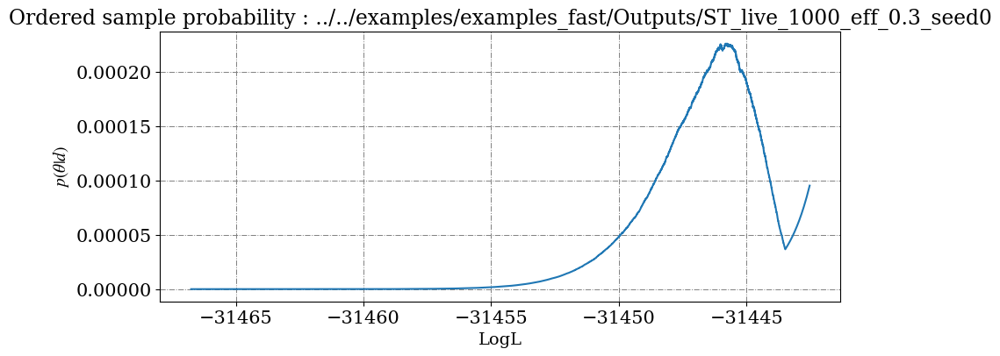

In [9]:
# Get the path and plot
samples_path = os.path.join( '../../examples/examples_fast/Outputs', 'ST_live_1000_eff_0.3_seed0' )
fig, ax = plotConvergence( samples_path=samples_path , threshold=1e-10)

## Geometry plot

Looking at the inferred best fit geometry

YOU ARE USING 1 HOT SPOT MODEL
########################
MODE:0 
Maximum Likelihood value : -55464.76752000764


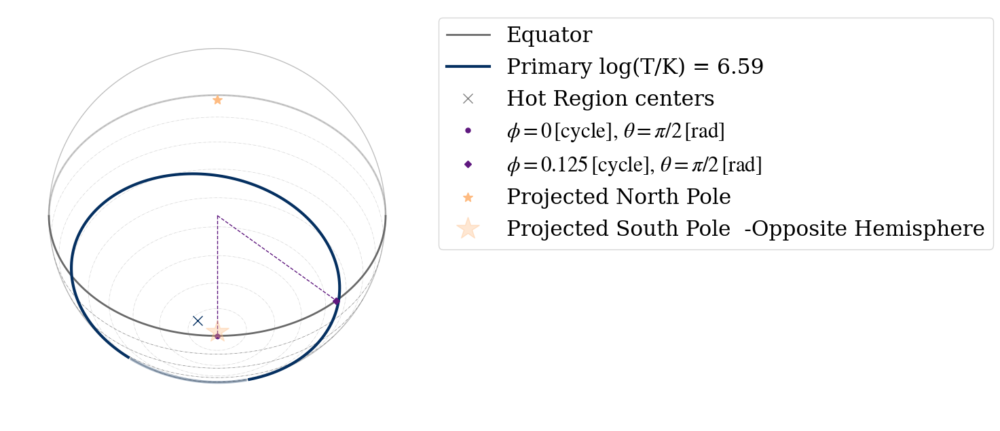

In [10]:
# Get the parameters
samples_path = os.path.join( '../../examples/examples_fast/Outputs', 'ST_live_1000_eff_0.3_seed0_v2' )
AverageP ,SigmaP, BestFitP, MAP_P = readSummary(samples_path,verbose=False)

# Do the plot
ST.likelihood(BestFitP,reinitialise=True)
ax = plot_projection_general(ST.likelihood, 'ST', "I","SP", antiphase=False, SaveFlag = False, Name = 'BestFit' )

# Do the prints
print ("########################")
print ("MODE:0 ")
print(f"Maximum Likelihood value : {ST.likelihood(BestFitP, reinitialise=True)}")

## Background plot

Plot the inferred background. Since the example is simple, we do not have all the samples needed in `post_equal_weight.dat` and the background distribution can not be plotted.

Loaded the only existing signal. Please check that it is from the required instrument
Loaded the only existing signal. Please check that it is from the required instrument
Maximum counts in an energy bin : 2382.092233371737


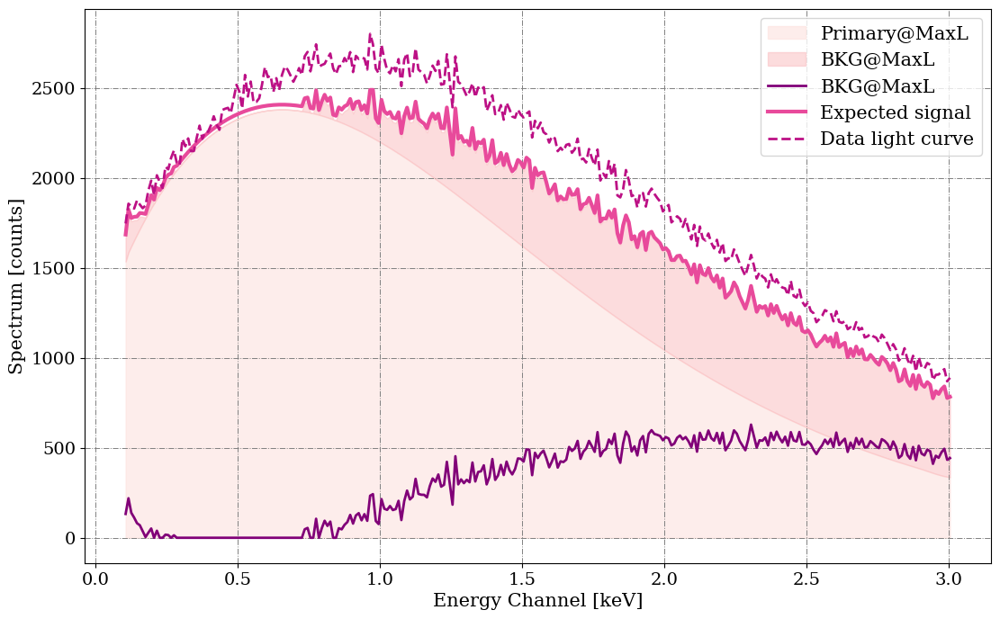

In [11]:
samples_path = os.path.join( '../../examples/examples_fast/Outputs', 'ST_live_1000_eff_0.3_seed0_v2' )
fig, ax = plotBackgroundSpectrum( XPSI_model=ST, 
                        samples_path=samples_path, 
                        InstrumentName=None,
                        plot_params=None,
                        Nsamples=200,
                        plot_range=False, 
                        yscale='linear',
                        plot_support=False)

## Load the run for PostProcessor

Let's now load the run

In [ ]:
ST.runs = xpsi.Runs.load_runs(ID='ST',
                               run_IDs=['run'],
                               roots=['ST_live_1000_eff_0.3_seed0'],
                               base_dirs=['../../examples/examples_fast/Outputs/'],
                               use_nestcheck=[False],
                               kde_settings=getdist_kde_settings,
                               likelihood=ST.likelihood,
                               names=ST.names,
                               bounds=ST.bounds,
                               labels=ST.labels,
                               overwrite_transformed=True)

## Corner plots

Looking now at all the inferred parameters

Executing posterior density estimation...
Curating set of runs for posterior plotting...
Run set curated.
Constructing lower-triangle posterior density plot via Gaussian KDE:
plotting:  ['mass', 'radius']
plotting:  ['mass', 'distance']
plotting:  ['mass', 'cos_inclination']
plotting:  ['mass', 'p__phase_shift']
plotting:  ['mass', 'p__super_colatitude']
plotting:  ['mass', 'p__super_radius']
plotting:  ['mass', 'p__super_temperature']
plotting:  ['mass', 'compactness']
plotting:  ['radius', 'distance']
plotting:  ['radius', 'cos_inclination']
plotting:  ['radius', 'p__phase_shift']
plotting:  ['radius', 'p__super_colatitude']
plotting:  ['radius', 'p__super_radius']
plotting:  ['radius', 'p__super_temperature']
plotting:  ['radius', 'compactness']
plotting:  ['distance', 'cos_inclination']
plotting:  ['distance', 'p__phase_shift']
plotting:  ['distance', 'p__super_colatitude']
plotting:  ['distance', 'p__super_radius']
plotting:  ['distance', 'p__super_temperature']
plotting:  ['dista

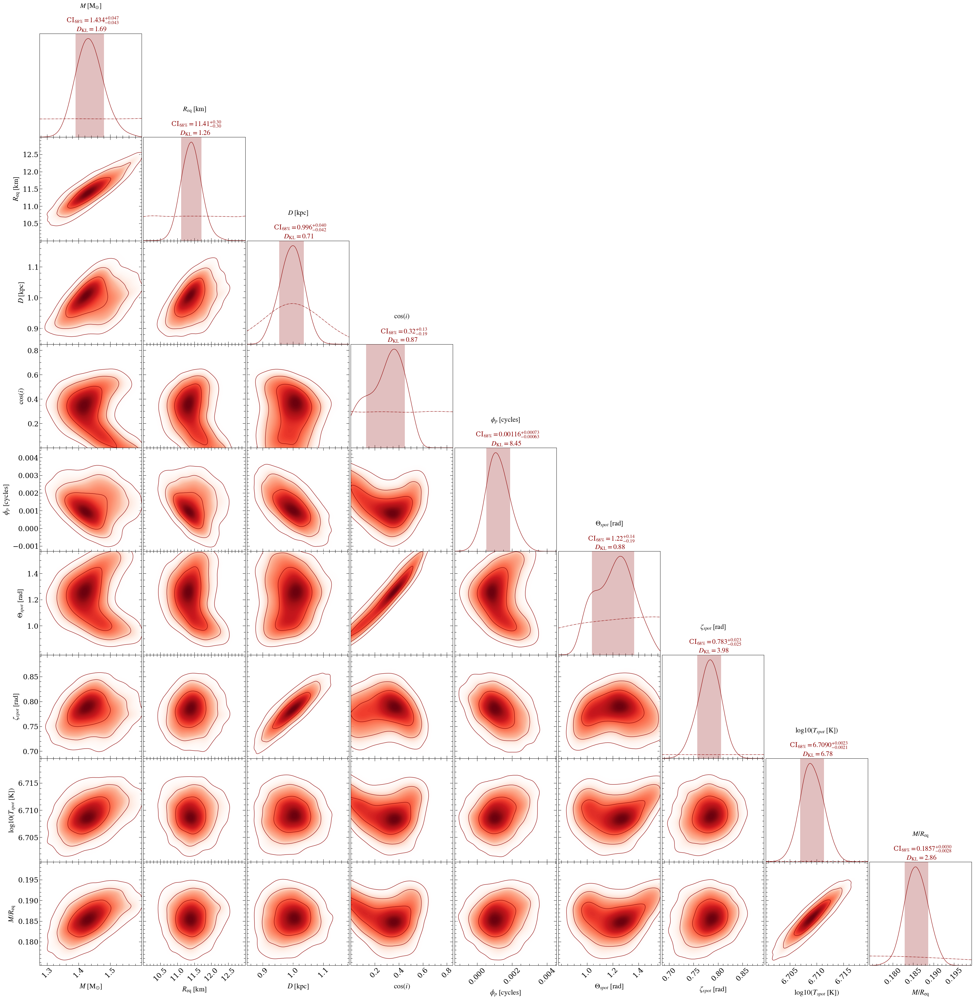

In [13]:
pp = xpsi.PostProcessing.CornerPlotter([ST.runs])
_ = pp.plot(
     params=ST.names,
    
     IDs=OrderedDict([('ST', ['run',]),]),
     prior_density=True,
     KL_divergence=True,
     ndraws=5e4,
     combine=False, combine_all=True, only_combined=False, overwrite_combined=True,
     param_plot_lims={},
     bootstrap_estimators=False,
     bootstrap_density=False,
     n_simulate=200,
     crosshairs=False,
     write=False,
     ext='.png',
     maxdots=3000,
     root_filename='run',
     credible_interval_1d=True,
     annotate_credible_interval=True,
     compute_all_intervals=False,
     sixtyeight=True,
     axis_tick_x_rotation=45.0,
     num_plot_contours=3,
     subplot_size=4.0,
     legend_corner_coords=(0.675,0.8),
     legend_frameon=False,
     scale_attrs=OrderedDict([('legend_fontsize', 2.0),
                              ('axes_labelsize', 1.35),
                              ('axes_fontsize', 'axes_labelsize'),
                             ]
                            ),
     colormap='Reds',
     shaded=True,
     shade_root_index=-1,
     rasterized_shade=True,
     no_ylabel=True,
     no_ytick=True,
     lw=1.0,
     lw_1d=1.0,
     filled=False,
     normalize=True,
     veneer=True,
     #contour_colors=['orange'],
     tqdm_kwargs={'disable': False},
     lengthen=2.0,
     embolden=1.0,
     nx=500)


Now let's plot a subset of those parameters, say : Mass, Radius and Compactness

Executing posterior density estimation...
Curating set of runs for posterior plotting...
Run set curated.
Constructing lower-triangle posterior density plot via Gaussian KDE:
plotting:  ['mass', 'radius']
plotting:  ['mass', 'compactness']
plotting:  ['radius', 'compactness']
Adding 1D marginal prior density functions...
Plotting prior for posterior ST...
Drawing samples from the joint prior...
Samples drawn.
Estimating 1D marginal KL-divergences in bits...
mass KL-divergence = 1.6920...
radius KL-divergence = 1.2603...
compactness KL-divergence = 2.8594...
Estimated 1D marginal KL-divergences.
Added 1D marginal prior density functions.
Veneering spines and axis ticks...
Veneered.
Adding 1D marginal credible intervals...
Plotting credible regions for posterior ST...
Added 1D marginal credible intervals.
Constructed lower-triangle posterior density plot.
Posterior density estimation complete.


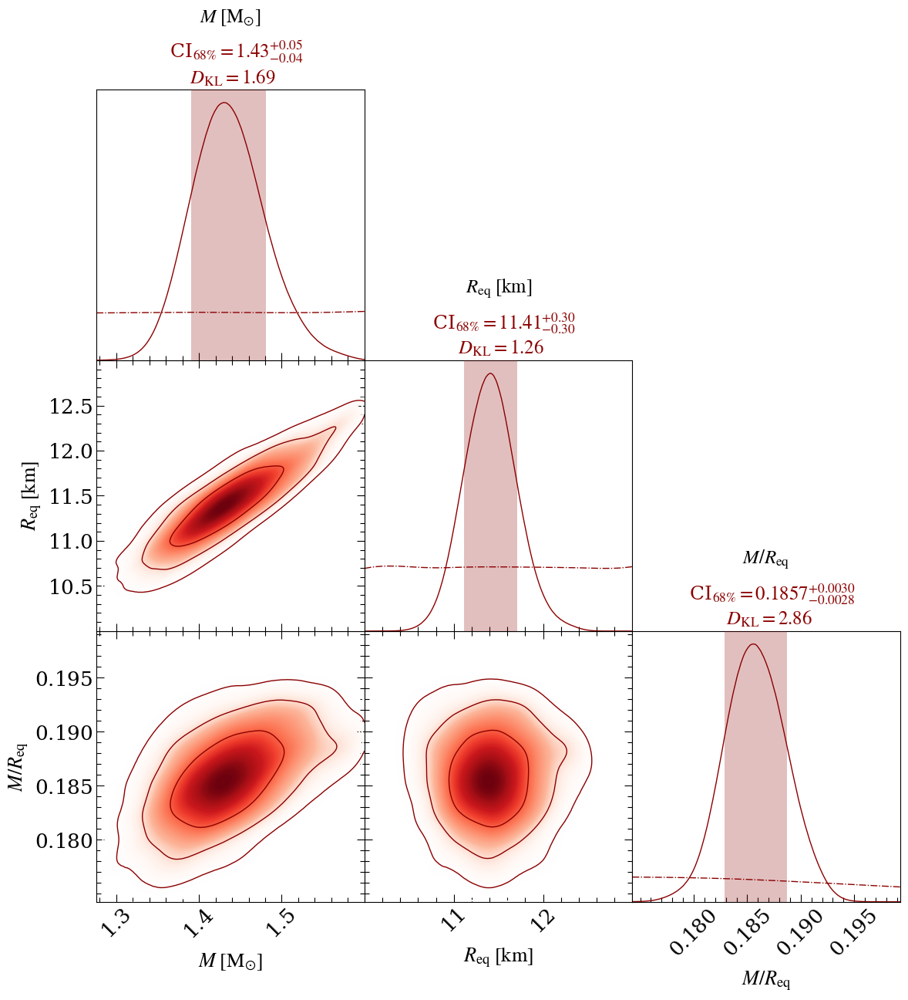

In [14]:
_ = pp.plot(
     params=["mass", "radius", "compactness"],
    
     IDs=OrderedDict([('ST', ['run',]),]),
     prior_density=True,
     KL_divergence=True,
     ndraws=5e4,
     combine=False, combine_all=True, only_combined=False, overwrite_combined=True,
     param_plot_lims={},
     bootstrap_estimators=False,
     bootstrap_density=False,
     n_simulate=200,
     crosshairs=False,
     write=False,
     ext='.png',
     maxdots=3000,
     root_filename='run',
     credible_interval_1d=True,
     annotate_credible_interval=True,
     compute_all_intervals=False,
     sixtyeight=True,
     axis_tick_x_rotation=45.0,
     num_plot_contours=3,
     subplot_size=4.0,
     legend_corner_coords=(0.675,0.8),
     legend_frameon=False,
     scale_attrs=OrderedDict([('legend_fontsize', 2.0),
                              ('axes_labelsize', 1.35),
                              ('axes_fontsize', 'axes_labelsize'),
                             ]
                            ),
      colormap='Reds',
     shaded=True,
     shade_root_index=-1,
     rasterized_shade=True,
     no_ylabel=True,
     no_ytick=True,
     lw=1.0,
     lw_1d=1.0,
     filled=False,
     normalize=True,
     veneer=True,
     #contour_colors=['orange'],
     tqdm_kwargs={'disable': False},
     lengthen=2.0,
     embolden=1.0,
     #Adjusting the decimal precision for the reported mass interval (and automatic precision for the others):
     precisions=[2,None,None],
     nx=500)


For the sake of example, let's assume one has multiple runs for the same model and wants to plots them all on a same plot.

Here, we have two runs, one performed fixing multinest seed to 0, and the second fixing the  seed to 42.

In [ ]:
# Loading the runs

ST.runs = xpsi.Runs.load_runs(ID='ST',
                               run_IDs=['run_seed0','run_seed42'],
                               roots=['ST_live_1000_eff_0.3_seed0','ST_live_1000_eff_0.3_seed42'],
                               base_dirs=['../../examples/examples_fast/Outputs/',
                                         '../../examples/examples_fast/Outputs/'],
                               use_nestcheck=[True]*2,#[True]*2,
                               kde_settings=getdist_kde_settings,
                               likelihood=ST.likelihood,
                               names=ST.names,
                               bounds=ST.bounds,
                               labels=ST.labels,
                               overwrite_transformed=True)

Executing posterior density estimation...
Curating set of runs for posterior plotting...
Run set curated.
Constructing lower-triangle posterior density plot via Gaussian KDE:
plotting:  ['mass', 'radius']
plotting:  ['mass', 'distance']
plotting:  ['mass', 'cos_inclination']
plotting:  ['mass', 'p__phase_shift']
plotting:  ['mass', 'p__super_colatitude']
plotting:  ['mass', 'p__super_radius']
plotting:  ['mass', 'p__super_temperature']
plotting:  ['mass', 'compactness']
plotting:  ['radius', 'distance']
plotting:  ['radius', 'cos_inclination']
plotting:  ['radius', 'p__phase_shift']
plotting:  ['radius', 'p__super_colatitude']
plotting:  ['radius', 'p__super_radius']
plotting:  ['radius', 'p__super_temperature']
plotting:  ['radius', 'compactness']
plotting:  ['distance', 'cos_inclination']
plotting:  ['distance', 'p__phase_shift']
plotting:  ['distance', 'p__super_colatitude']
plotting:  ['distance', 'p__super_radius']
plotting:  ['distance', 'p__super_temperature']
plotting:  ['dista

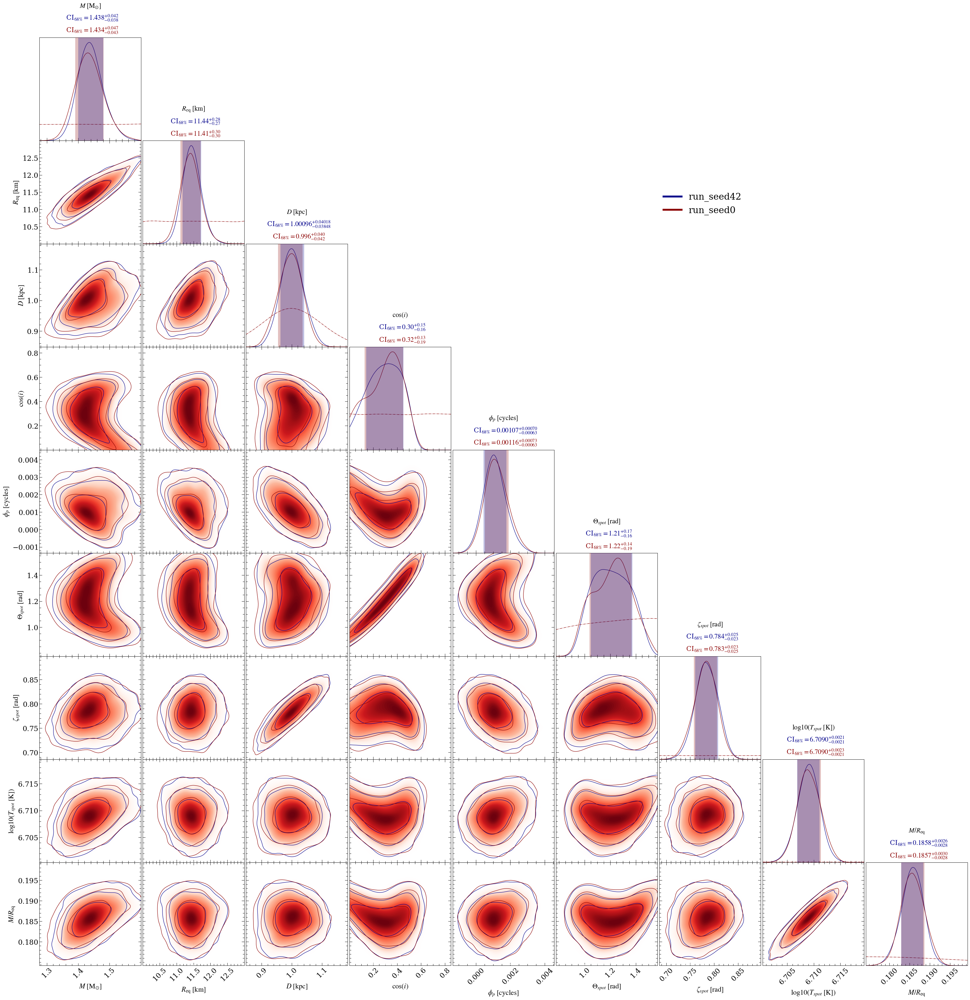

In [16]:
pp = xpsi.PostProcessing.CornerPlotter([ST.runs])
_ = pp.plot(
     params=ST.names,
     IDs=OrderedDict([('ST', ['run_seed0','run_seed42',]),]),
     prior_density=True,
     KL_divergence=True,
     ndraws=5e4,
     combine=False, combine_all=True, only_combined=False, overwrite_combined=True,
     param_plot_lims={},
     bootstrap_estimators=False,
     bootstrap_density=False,
     n_simulate=200,
     crosshairs=False,
     write=False,
     ext='.png',
     maxdots=3000,
     root_filename='run',
     credible_interval_1d=True,
     credible_interval_1d_all_show=True, # To show credible intervals for all runs/models
     show_vband=[0,1],                   # To list which vertical colored bands are shown in 1D-posteriors
                                         #  0 for run_seed0,  1 for run_seed42
     annotate_credible_interval=True,
     compute_all_intervals=False,
     sixtyeight=True,
     axis_tick_x_rotation=45.0,
     num_plot_contours=3,
     subplot_size=4.0,
     legend_corner_coords=(0.675,0.8),
     legend_frameon=False,
     scale_attrs=OrderedDict([('legend_fontsize', 2.0),
                              ('axes_labelsize', 1.35),
                              ('axes_fontsize', 'axes_labelsize'),
                             ]
                            ),
     colormap='Reds',
     shaded=True,
     shade_root_index=-1,
     rasterized_shade=True,
     no_ylabel=True,
     no_ytick=True,
     lw=1.0,
     lw_1d=1.0,
     filled=False,
     normalize=True,
     veneer=True,
     tqdm_kwargs={'disable': False},
     lengthen=2.0,
     embolden=1.0,
     nx=500)

# If you have multiple runs/models, you can increase the legend linewidth
for legobj in _.legend.legend_handles:
        legobj.set_linewidth(5.0)

We can also obtain the credible intervals shown on the plot in the form of a list:

In [17]:
credible_intervals=pp.credible_intervals

In [18]:
# Printing the first one:
print(credible_intervals["ST_run_seed0"])

[[ 1.434e+00 -4.300e-02  4.700e-02]
 [ 1.141e+01 -3.000e-01  3.000e-01]
 [ 9.960e-01 -4.200e-02  4.000e-02]
 [ 3.200e-01 -1.900e-01  1.300e-01]
 [ 1.160e-03 -6.300e-04  7.300e-04]
 [ 1.220e+00 -1.900e-01  1.400e-01]
 [ 7.830e-01 -2.500e-02  2.300e-02]
 [ 6.709e+00 -2.100e-03  2.300e-03]
 [ 1.857e-01 -2.800e-03  3.000e-03]]


In [19]:
# Printing the second one:
print(credible_intervals["ST_run_seed42"])

[[ 1.43800e+00 -3.80000e-02  4.20000e-02]
 [ 1.14400e+01 -2.70000e-01  2.80000e-01]
 [ 1.00096e+00 -3.84800e-02  4.01800e-02]
 [ 3.00000e-01 -1.60000e-01  1.50000e-01]
 [ 1.07000e-03 -6.30000e-04  7.00000e-04]
 [ 1.21000e+00 -1.60000e-01  1.70000e-01]
 [ 7.84000e-01 -2.30000e-02  2.50000e-02]
 [ 6.70900e+00 -2.10000e-03  2.10000e-03]
 [ 1.85800e-01 -2.80000e-03  2.60000e-03]]


Assuming that one knows the values that have been used to produce the data and wants to show them:

In [9]:
# Our case: 
ST.truths={'mass': 1.4,                               # Mass in solar Mass
          'radius': 12.,                              # Equatorial radius in km
          'distance': 1.0,                            # Distance in kpc
          'cos_inclination': math.cos(60*np.pi/180),  # Cosine of Earth inclination to rotation axis
          'p__phase_shift': 0.0,                    # Phase shift
          'p__super_colatitude': 70*np.pi/180,      # Colatitude of the centre of the superseding region
          'p__super_radius': 0.75,                  # Angular radius of the (circular) superseding region
          'p__super_temperature':6.7}               # Temperature in log 

ST.truths['compactness']=gravradius(ST.truths['mass'])/ST.truths['radius']

In [ ]:
# Loading the run again :)

ST.runs = xpsi.Runs.load_runs(ID='ST',
                               run_IDs=['run'],
                               roots=['ST_live_1000_eff_0.3_seed0'],
                               base_dirs=['../../examples/examples_fast/Outputs/'],
                               use_nestcheck=[True],
                               kde_settings=getdist_kde_settings,
                               likelihood=ST.likelihood,
                               names=ST.names,
                               bounds=ST.bounds,
                               labels=ST.labels,
                               truths=ST.truths, # Adding this line
                               overwrite_transformed=True)

Executing posterior density estimation...
Curating set of runs for posterior plotting...
Run set curated.
Constructing lower-triangle posterior density plot via Gaussian KDE:
plotting:  ['mass', 'radius']
plotting:  ['mass', 'distance']
plotting:  ['mass', 'cos_inclination']
plotting:  ['mass', 'p__phase_shift']
plotting:  ['mass', 'p__super_colatitude']
plotting:  ['mass', 'p__super_radius']
plotting:  ['mass', 'p__super_temperature']
plotting:  ['mass', 'compactness']
plotting:  ['radius', 'distance']
plotting:  ['radius', 'cos_inclination']
plotting:  ['radius', 'p__phase_shift']
plotting:  ['radius', 'p__super_colatitude']
plotting:  ['radius', 'p__super_radius']
plotting:  ['radius', 'p__super_temperature']
plotting:  ['radius', 'compactness']
plotting:  ['distance', 'cos_inclination']
plotting:  ['distance', 'p__phase_shift']
plotting:  ['distance', 'p__super_colatitude']
plotting:  ['distance', 'p__super_radius']
plotting:  ['distance', 'p__super_temperature']
plotting:  ['dista

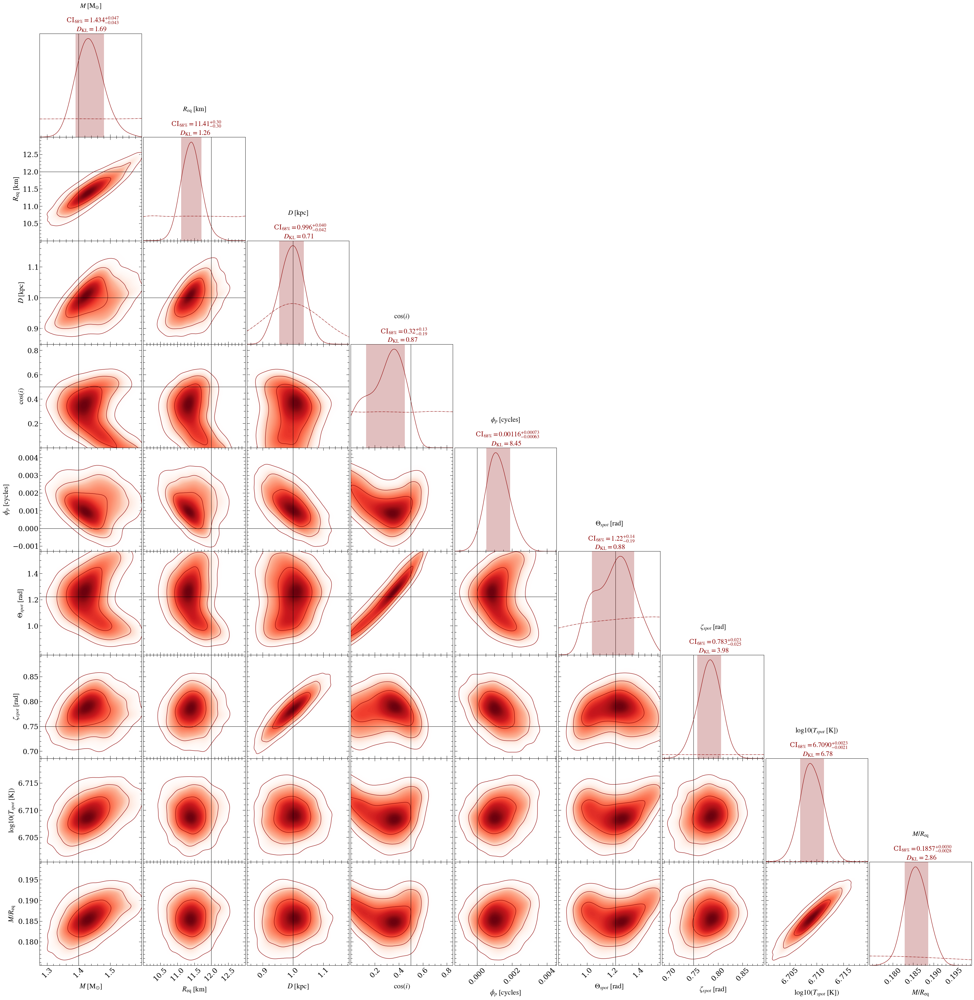

In [22]:
pp = xpsi.PostProcessing.CornerPlotter([ST.runs])
_ = pp.plot(
     params=ST.names,
    
     IDs=OrderedDict([('ST', ['run',]),]),
     prior_density=True,
     KL_divergence=True,
     ndraws=5e4,
     combine=False, combine_all=True, only_combined=False, overwrite_combined=True,
     param_plot_lims={},
     bootstrap_estimators=False,
     bootstrap_density=False,
     n_simulate=200,
     crosshairs=True, # Turn this to true
     write=False,
     ext='.png',
     maxdots=3000,
     root_filename='run',
     credible_interval_1d=True,
     credible_interval_1d_show_all=True,
     annotate_credible_interval=True,
     compute_all_intervals=False,
     sixtyeight=True,
     axis_tick_x_rotation=45.0,
     num_plot_contours=3,
     subplot_size=4.0,
     legend_corner_coords=(0.675,0.8),
     legend_frameon=False,
     scale_attrs=OrderedDict([('legend_fontsize', 2.0),
                              ('axes_labelsize', 1.35),
                              ('axes_fontsize', 'axes_labelsize'),
                             ]
                            ),
      colormap='Reds',
     shaded=True,
     shade_root_index=-1,
     rasterized_shade=True,
     no_ylabel=True,
     no_ytick=True,
     lw=1.0,
     lw_1d=1.0,
     filled=False,
     normalize=True,
     veneer=True,
     #contour_colors=['orange'],
     tqdm_kwargs={'disable': False},
     lengthen=2.0,
     embolden=1.0,
     nx=500)


## Residual plot

Now let’s plot the standardised Poissonian residuals of the first run

Declaring plot class settings...
Settings declared.
Instantiating a residual plotter for posterior checking...
Residual plotter instantiated.
Plotting signals for posterior checking...
Curating set of runs for posterior plotting...
Run set curated.
Handling posterior ST...
Checking whether an existing cache can be read:
Creating new cache file...
Attempting to archive existing cache file in a subdirectory...
Targeting subdirectory: ./archive.
Exisiting cache file archived in subdirectory ./archive.
Initialising cache file...
Cache file initialised.
Cache file created.
Cache state determined.


Signal caching loop:   0%|          | 0/100 [00:00<?, ?it/s]

ResidualPlot object iterating over samples...
ResidualPlot object finished iterating.
ResidualPlot object finalizing...
ResidualPlot object finalized.
Writing plot to disk...
ResidualPlot instance plot will be written to path ./ST.run__signalplot_residuals.pdf...
Written.
Handled posterior ST.
Plotted signals for posterior checking.


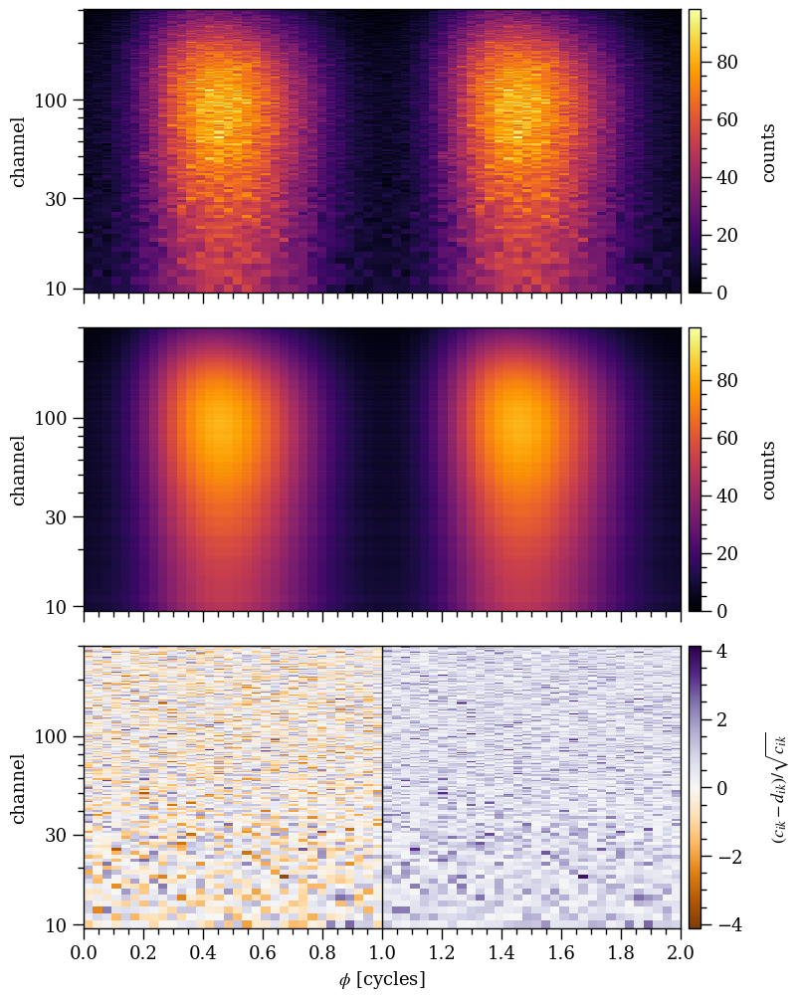

In [23]:
# Now let's plot the resudual of the first run.
pp = xpsi.SignalPlotter([ST.runs])
# Setting next the yticks for the 3 plots, alternating the main plot and the color bar y-ticks.
# (None if using automatic tikcs)
xpsi.ResidualPlot.declare_settings(yticks=[[10,30,100],None,[10,30,100],None,[10,30,100],None])
pp.plot(IDs=OrderedDict([('ST', ['run']),
                        ]),
        combine=False, # use these controls if more than one run for a posterior
        combine_all=False,
        force_combine=False,
        only_combined=False,
        force_cache=True,
        nsamples=100,
        plots = {'ST': xpsi.ResidualPlot()})

pp.plots["ST"].fig


## Signal plots

Now let’s plot pulse and spectrum plots for the inferred signals.

In [24]:
ST.likelihood.clear_cache()
p=[1.4,12,1.,math.cos(60*np.pi/180),0.0,70*np.pi/180, 0.75,6.7]
ST.likelihood.check(None, [-3.1603740790e+04], 1.0e-5, physical_points=[p])

Checking likelihood and prior evaluation before commencing sampling...
Not using ``allclose`` function from NumPy.
Using fallback implementation instead.
Checking closeness of likelihood arrays:
-3.1603740790e+04 | -3.1603740790e+04 .....
Closeness evaluated.
Log-likelihood value checks passed on root process.
Checks passed.


'Log-likelihood value checks passed on root process.'

In [25]:
pp = xpsi.SignalPlotter([ST.runs])

In [26]:
# Setting next the yticks: First to the 4 main plots and then to the 4 color bars.
xpsi.PulsePlot.declare_settings(extension='.png',yticks=[[0.2,0.5,1.0],None,[10,30,100],None,None,None,None,None])
pp.plot(
     IDs=OrderedDict([('ST', ['run',]),]),  
   nsamples=200,
   plots = {         
            'ST': xpsi.PulsePlot(use_fgivenx=True,
                                        comp_expectation_line_kwargs=dict(color='b',
                                                                           ls='-.',
                                                                           lw=0.75,
                                                                           alpha=1.0),
                                        show_components=True,
                                        fig_dir='.',
                                        write=True,
                                        root_filename= 'ST_model_signal',),       
            }
       )        


Declaring plot class settings...
Settings declared.
Instantiating a pulse-profile plotter for posterior checking...
Pulse-profile plotter instantiated.
Plotting signals for posterior checking...
Curating set of runs for posterior plotting...
Run set curated.
Handling posterior ST...
Checking whether an existing cache can be read:
Cache state determined.
PulsePlot object iterating over samples...
Adding credible intervals on the incident photon flux signal as function of phase...


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/999 [00:00<?, ?it/s]

Credible intervals added.
Added conditional posterior contours for incident signal.
Adding credible intervals on the count-rate signal as function of phase...


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/999 [00:00<?, ?it/s]

Credible intervals added.
Added conditional posterior contours for registered signal.
PulsePlot object finished iterating.
PulsePlot object finalizing...
PulsePlot object finalized.
Writing plot to disk...
PulsePlot instance plot will be written to path ./ST_model_signal__ST.run__signalplot_pulse.png...
Written.
Handled posterior ST.
Plotted signals for posterior checking.


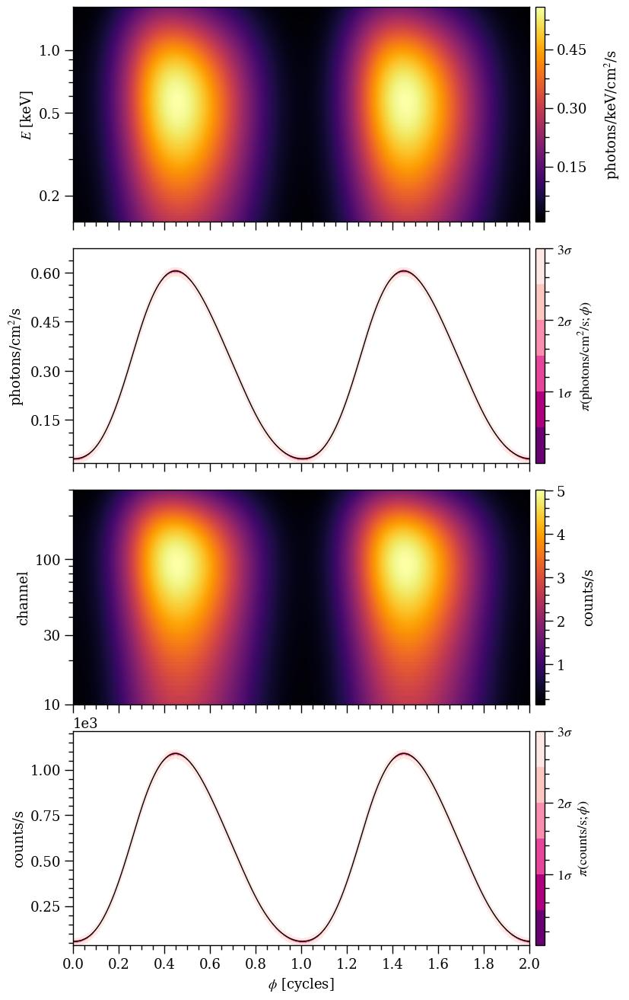

In [27]:
pp.plots['ST'].fig

In [28]:
# Setting next both the xticks and yticks: First to the 3 main plots and then to the 3 color bars.
xpsi.SpectrumPlot.declare_settings(extension='.png',xticks=[[0.2,0.5,1.0],[10,30,100],[10,30,100],\
                                                            None,None,None],\
                                   yticks=[[0.1,0.2],None,[1.0,2.0],None,None,None]
                                  )
pp.plot(
     IDs=OrderedDict([('ST', ['run',]),]),     
   nsamples=200,
   plots = {
            'ST': xpsi.SpectrumPlot(use_fgivenx=True,
                                        expectation_line_kwargs=dict(color='k',
                                                                      ls='-',
                                                                      lw=1.0,
                                                                      alpha=1.0),
                                         sample_line_kwargs=dict(color='pink',
                                                                 ls='-',
                                                                 lw=0.05,
                                                                 alpha=1.0),
                                         comp_expectation_line_kwargs=dict(color='b',
                                                                        ls='-.',
                                                                        lw=0.75,
                                                                        alpha=1.0),
                                         show_attenuated=False,#True,
                                         show_components=True,
                                         fig_dir='.',
                                         write=True,
                                         root_filename= 'ST_spectra',
                                       ),       
           }
       ) 

Declaring plot class settings...
Settings declared.
Instantiating a spectrum plotter for posterior checking...
Spectrum plotter instantiated.
Plotting signals for posterior checking...
Curating set of runs for posterior plotting...
Run set curated.
Handling posterior ST...
Checking whether an existing cache can be read:
Cache state determined.
SpectrumPlot object iterating over samples...
Adding credible intervals on the incident specific photon flux spectrum...


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/640 [00:00<?, ?it/s]

Credible intervals added.
Adding credible intervals on the count-rate spectrum...


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/291 [00:00<?, ?it/s]

Credible intervals added.
Added conditional posterior contours for incident spectrum.
SpectrumPlot object finished iterating.
SpectrumPlot object finalizing...
SpectrumPlot object finalized.
Writing plot to disk...
SpectrumPlot instance plot will be written to path ./ST_spectra__ST.run__signalplot_spectrum.png...
Written.
Handled posterior ST.
Plotted signals for posterior checking.


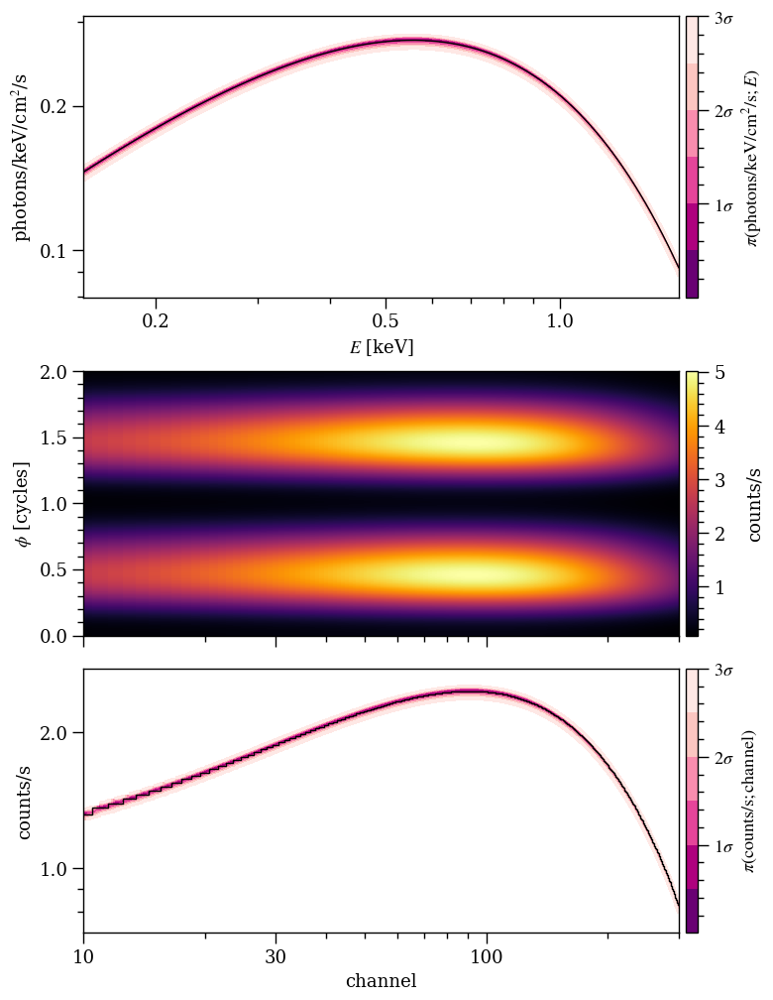

In [29]:
pp.plots['ST'].fig

# P-P plot

In order to show if the inference is unbiased, a P-P plot can be made where P could stand for probability, percent or proportion. This is something that is often done is graviational wave science (see for example Figure A1 from [this](https://arxiv.org/pdf/2006.00714) paper). The gray regions cover the cumulative 1-, 2-, and 3-$\sigma$ credible intervals in order of decreasing opacity (their "size" is thus dependent on the amount of inference runs used). Each colored line tracks the cumulative fraction of events within this credible interval for a different parameter. For unbiased recovery, the lines should lie perfectly along the diagonal.

The function below demonstrates how to generate a P-P plot. In this example, the P-P plot is created for a single parameter across just two inference runs. Note that in practice, P-P plots are often generated using a larger number of inference runs to improve statistical robustness.

In [7]:
def get_credible_interval(filepath: str, param_to_plot: str, params_data: list, truth: float):
    """
    Calculate the credible interval for a parameter in an inference run.

    This function computes the percentage of inferred parameter values 
    that fall below a given true value, weighted by the sampling weights.

    Parameters
    ----------
    filepath : str
        Path to the output `.txt` file containing the sampling weights and parameter data.
    param_to_plot : str
        Name of the parameter for which the credible interval is to be calculated.
    params_data : list
        List of parameter names in the same order as they appear in the output file.
    truth : float
        The true value of the parameter.

    Returns
    -------
    float
        The credible interval, expressed as the weighted fraction of samples 
        with parameter values less than the true value.
    """
    # load the data and its weights 
    data = np.loadtxt(filepath)
    weights = data[:,0]

    # get the samples. Add 2, because column 0 is weights 
    # and column 1 is -2*loglikelihood
    idx_param = params_data.index(param_to_plot) + 2
    data_param = data[:,idx_param]

    # get indices of all samples that fall below the true value 
    filter = np.where(data_param < truth)

    # get corresponding weights 
    weights_below_true_val = weights[filter]

    credible_interval = np.sum(weights_below_true_val)/np.sum(weights)

    return credible_interval

def make_pp_plot(credible_intervals: list): 
    """
    Create a PP-plot for a single parameter. The PP-plot is generated
    from multiple inference runs, all sharing the same true value. The 
    plot visualizes how well the inferred credible intervals recover 
    the true parameter value. Credible intervals (68%, 95%, and 99.7%) 
    are shaded in the plot to indicate expected variations under ideal condition

    Parameters
    ----------
    credible_intervals : list
        List of credible intervals from various inference runs, representing the 
        fraction of inferred parameter values below the true value for each run.
    """
    fig, ax = plt.subplots(figsize=(6,6))

    x_values = np.linspace(0., 0.999, 1001)       

    # plot grey area 
    credible_interval=[0.68, 0.95, 0.997]
    credible_interval_alpha = [0.3,0.3/2,0.3/3]

    # determine number of credible intervals to plot 
    N = len(credible_intervals)

    for ci, alpha in zip(credible_interval, credible_interval_alpha):

        edge_of_bound = (1. - ci) / 2.
        lower = binom.ppf(1 - edge_of_bound, N, x_values) / N
        upper = binom.ppf(edge_of_bound, N, x_values) / N
        # The binomial point percent function doesn't always return 0 @ 0,
        # so set those bounds explicitly to be sure
        lower[0] = 0
        upper[0] = 0
        ax.fill_between(x_values, lower, upper, alpha=alpha, color='grey')

    # plot lines 
    x_values = np.linspace(0., 0.999, 1001)  

    # now, plot the credible intervals
    pp = np.array([sum(credible_intervals < xx)/len(credible_intervals) for xx in x_values])
    ax.plot(x_values, pp)

    ax.set_xlabel("Credible interval")
    ax.set_ylabel("Fraction of events in credible interval")

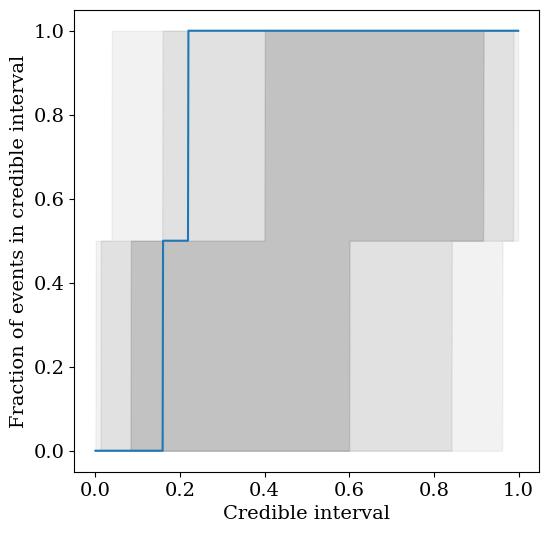

In [10]:
files = ['../../examples/examples_fast/Outputs/ST_live_1000_eff_0.3_seed0.txt', 
         '../../examples/examples_fast/Outputs/ST_live_1000_eff_0.3_seed42.txt']

credible_intervals = []
for file in files:
    credible_interval = get_credible_interval(file, 'mass', ST.names, ST.truths['mass'])
    credible_intervals.append(credible_interval)

make_pp_plot(credible_intervals)